<a href="https://colab.research.google.com/github/DataAnalyticSscience/datasciencefoundations/blob/main/Unveiling_the_Hidden_Patterns_A_K_Means_Clustering_Analysis_on_the_Wine_Dataset_to_Discover_Intrinsic_Wine_Groups.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Unveiling the Hidden Patterns: A K-Means Clustering Analysis on the Wine Dataset to Discover Intrinsic Wine Groups

## Case Study Summary / Executive Summary

A case study involving k-means clustering analysis on the Wine Dataset can focus on identifying inherent groupings among the wine samples based on their chemical composition. The goal of this case study would be to explore how wines can be segmented into distinct clusters that might correlate with their cultivar origins, without using the cultivar labels during the clustering process. Here's a detailed proposal for conducting a k-means clustering analysis:

### Introduction:
---

The world of wine is rich and diverse, with countless varieties that appeal to a wide range of palates. Understanding the natural groupings of wines based on their chemical composition can offer valuable insights into their quality, characteristics, and even their origin. This case study aims to apply the K-Means clustering algorithm to the Wine Dataset, a collection of chemical analyses of wines grown in the same region in Italy but derived from three different cultivars. The goal is to uncover intrinsic wine groups, which could serve as a basis for classification, recommendation, or further analysis on wine characteristics.

### Objective:
---

To uncover natural groupings among wines based on their chemical properties, aiming to see if these groupings align with the wine cultivars. This analysis could provide insights into how chemical properties influence wine classification and if k-means clustering can effectively differentiate wines from different cultivars based on their chemistry alone.

### Dataset Description:
---

The Wine Dataset consists of 178 wine samples from three different cultivars of the same region in Italy. There are 13 features for each sample, including Alcohol, Malic Acid, Ash, Alcalinity of Ash, Magnesium, Total Phenols, Flavanoids, Nonflavanoid Phenols, Proanthocyanins, Color Intensity, Hue, OD280/OD315 of diluted wines, and Proline. The dataset also includes a target variable indicating the cultivar origin of each wine sample.

### Methodology:
---

1. Data Preprocessing:
  - Load the dataset and perform any necessary cleaning steps.
  - Standardize the data to have a mean of 0 and a standard deviation of 1 for each feature, which is important for distance-based algorithms like k-means.
2. Exploratory Data Analysis (EDA):
  - Conduct EDA to understand the distributions of various features and the relationship between them.
  - Use visualizations, such as histograms, scatter plots, and correlation matrices, to identify patterns and outliers.
3. Determining the Number of Clusters (k):
  - Use the Elbow Method to determine the optimal number of clusters by plotting the within-cluster sum of squares (WCSS) against the number of clusters and finding the "elbow" point.
  - Consider other methods like the Silhouette Score to validate the choice of k.
4. K-Means Clustering:
  - Apply the k-means clustering algorithm to the dataset using the chosen number of clusters.
  - Analyze the centroids to understand the defining characteristics of each cluster.
5. Evaluation:
  - Evaluate the clustering performance using the silhouette score and compare the clusters with the actual cultivar labels to assess alignment.
  - Visualize the clusters in a 2D or 3D space using dimensionality reduction techniques (e.g., PCA, t-SNE) to inspect how well the clusters are separated.
6. Interpretation and Insights:
  - Discuss the characteristics that differentiate the clusters, relating them to wine properties and quality.
  - Explore whether the clusters correspond to the original wine cultivars and what this implies about the dataset's structure and the chemical basis of wine differentiation.

### Expected Outcomes:
---

The case study is expected to reveal whether k-means clustering can effectively segment wines based on their chemical properties and how these clusters relate to the wine cultivars. Insights gained from this analysis could inform winemakers about the chemical profiles of different wine types and help in marketing strategies by targeting specific clusters with distinct characteristics.

## Setting Up Environment

### Step 1: Install requisite packages

In [104]:
# ! pip install kaggle

### Step 2: Import requisite packages

In [105]:
import zipfile
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import plotly.express as px
import plotly.figure_factory as ff
import plotly.subplots as sp
import seaborn as sns

from sklearn.datasets import load_wine
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import confusion_matrix, classification_report

from google.colab import files
from google.colab import drive
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials
from typing_extensions import dataclass_transform

import warnings
warnings.filterwarnings("ignore")

### Step 4: Download and preview dataset

In [106]:
# Load the wine dataset
wine_data = load_wine()
wine_df = pd.DataFrame(data=wine_data.data, columns=wine_data.feature_names)
wine_df['target'] = wine_data.target

# Scale the features
scaler = StandardScaler()
df = pd.DataFrame(scaler.fit_transform(wine_df.drop('target', axis=1)), columns=wine_df.columns[:-1])

In [107]:
# Display the first few rows to confirm
df.head()

,alcohol,malic_acid,ash,alcalinity_of_ash,magnesium,total_phenols,flavanoids,nonflavanoid_phenols,proanthocyanins,color_intensity,hue,od280/od315_of_diluted_wines,proline
0,1.518613,-0.562250,0.232053,-1.169593,1.913905,0.808997,1.034819,-0.659563,1.224884,0.251717,0.362177,1.847920,1.013009
1,0.246290,-0.499413,-0.827996,-2.490847,0.018145,0.568648,0.733629,-0.820719,-0.544721,-0.293321,0.406051,1.113449,0.965242
2,0.196879,0.021231,1.109334,-0.268738,0.088358,0.808997,1.215533,-0.498407,2.135968,0.269020,0.318304,0.788587,1.395148
3,1.691550,-0.346811,0.487926,-0.809251,0.930918,2.491446,1.466525,-0.981875,1.032155,1.186068,-0.427544,1.184071,2.334574
4,0.295700,0.227694,1.840403,0.451946,1.281985,0.808997,0.663351,0.226796,0.401404,-0.319276,0.362177,0.449601,-0.037874


### Step 1: Data Preprocessing

First, we check for any missing values and scale the data since K-Means is sensitive to the scale of the data.

In [108]:
df.shape

(178, 13)

In [109]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 178 entries, 0 to 177
Data columns (total 13 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   alcohol                       178 non-null    float64
 1   malic_acid                    178 non-null    float64
 2   ash                           178 non-null    float64
 3   alcalinity_of_ash             178 non-null    float64
 4   magnesium                     178 non-null    float64
 5   total_phenols                 178 non-null    float64
 6   flavanoids                    178 non-null    float64
 7   nonflavanoid_phenols          178 non-null    float64
 8   proanthocyanins               178 non-null    float64
 9   color_intensity               178 non-null    float64
 10  hue                           178 non-null    float64
 11  od280/od315_of_diluted_wines  178 non-null    float64
 12  proline                       178 non-null    float64
dtypes: fl

In [110]:
# Check for missing values
print(df.isnull().sum())

alcohol                         0
malic_acid                      0
ash                             0
alcalinity_of_ash               0
magnesium                       0
total_phenols                   0
flavanoids                      0
nonflavanoid_phenols            0
proanthocyanins                 0
color_intensity                 0
hue                             0
od280/od315_of_diluted_wines    0
proline                         0
dtype: int64


### Step 2: Exploratory Data Analysis (EDA)

We perform a brief EDA to understand the distribution of some features and the target variable.

For a comprehensive analysis, conducting both univariate and multivariate analyses on all features of the Wine Dataset will provide deeper insights into the data's structure and relationships. Here's how you can approach these analyses:

#### Univariate Analysis

Univariate analysis involves examining each feature individually to understand its distribution, central tendency, and variability.

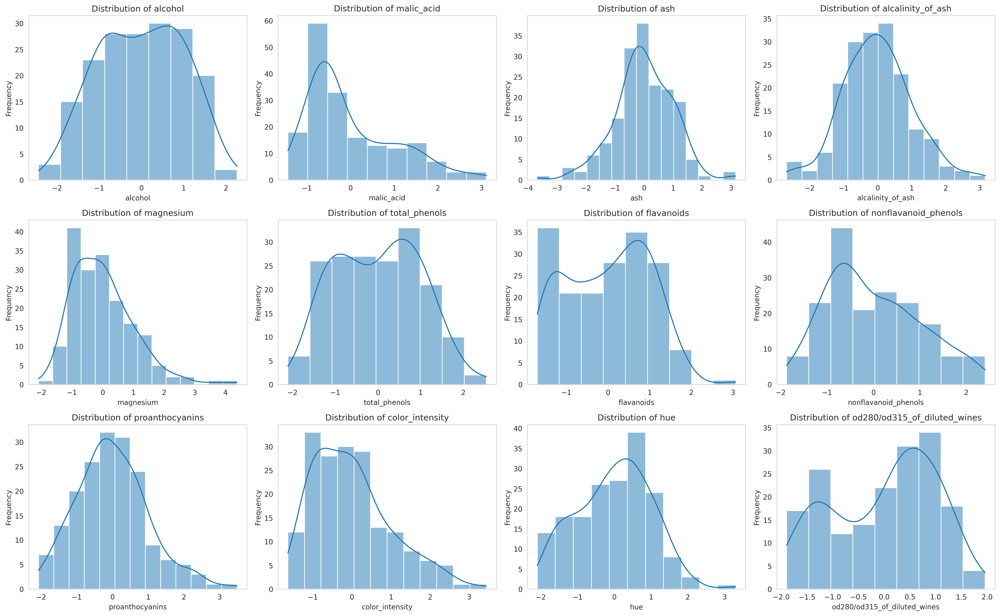

In [111]:
# Assuming 'wine_df' is your DataFrame and excluding the target variable for univariate analysis
features = df.columns[:-1]  # Exclude the target column

# Set up the matplotlib figure
plt.figure(figsize=(20, 16), dpi=300)

# Loop through the features and create subplots
for i, column in enumerate(features, 1):
    plt.subplot(4, 4, i)  # 4x4 grid and position i
    sns.histplot(df[column], kde=True)
    plt.title(f'Distribution of {column}')
    plt.xlabel(column)
    plt.ylabel('Frequency')
    plt.grid(False)  # Removes grid lines

# Adjust layout to not overlap plots
plt.tight_layout()
plt.show()

#### Multivariate Analysis

Multivariate analysis looks at the relationships between multiple features at once. This can be achieved through correlation matrices, pair plots, or scatter plots for selected feature pairs.

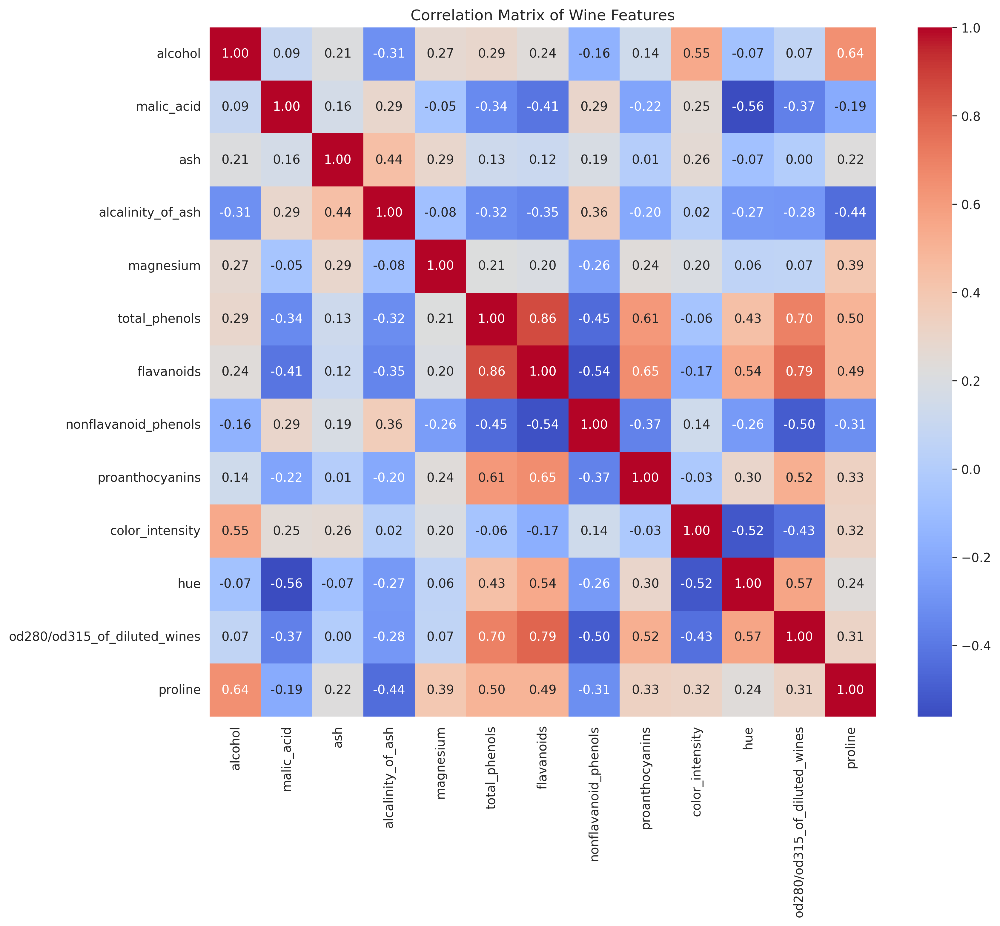

In [112]:
# Correlation Matrix
plt.figure(figsize=(12, 10), dpi=300)
sns.heatmap(df.corr(), annot=True, fmt=".2f", cmap='coolwarm')
plt.title('Correlation Matrix of Wine Features')
plt.show()

This correlation matrix provides insights into how features relate to one another, identifying potential positive or negative correlations.

Pair Plot

Due to the high dimensionality of the Wine Dataset, plotting all pairs might be overwhelming. You can select a subset of features for clarity or use dimensionality reduction for visualization.

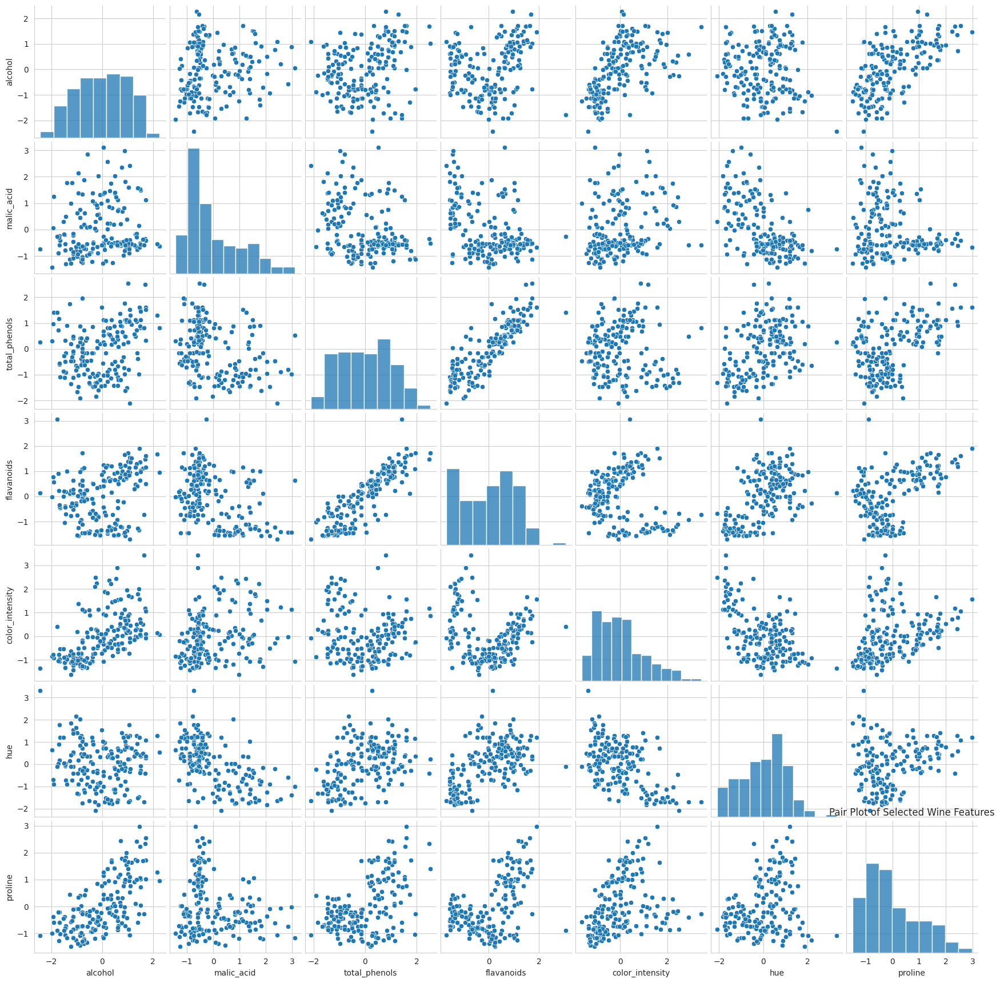

In [113]:
# Selecting a subset of features for the pair plot
selected_features = ['alcohol', 'malic_acid', 'total_phenols', 'flavanoids', 'color_intensity', 'hue', 'proline']
sns.pairplot(df[selected_features])
plt.title('Pair Plot of Selected Wine Features')
plt.grid(False)  # Removes grid lines
plt.show()

This pair plot visualizes the relationships between a subset of features, colored by the wine class. It can help identify patterns and relationships that might not be apparent from univariate analysis alone.

### Step 3: Determining the Number of Clusters (k)

We use the Elbow Method to find the optimal number of clusters for K-Means.

In [114]:
# Initialize and apply the scaler
scaler = StandardScaler()
scaled_features = scaler.fit_transform(df)

In [115]:
# Display the data types to confirm the selection and initial rows of scaled features for verification
scaled_features[:5, :]

array([[ 1.51861254, -0.5622498 ,  0.23205254, -1.16959318,  1.91390522,
         0.80899739,  1.03481896, -0.65956311,  1.22488398,  0.25171685,
         0.36217728,  1.84791957,  1.01300893],
       [ 0.24628963, -0.49941338, -0.82799632, -2.49084714,  0.01814502,
         0.56864766,  0.73362894, -0.82071924, -0.54472099, -0.29332133,
         0.40605066,  1.1134493 ,  0.96524152],
       [ 0.19687903,  0.02123125,  1.10933436, -0.2687382 ,  0.08835836,
         0.80899739,  1.21553297, -0.49840699,  2.13596773,  0.26901965,
         0.31830389,  0.78858745,  1.39514818],
       [ 1.69154964, -0.34681064,  0.4879264 , -0.80925118,  0.93091845,
         2.49144552,  1.46652465, -0.98187536,  1.03215473,  1.18606801,
        -0.42754369,  1.18407144,  2.33457383],
       [ 0.29570023,  0.22769377,  1.84040254,  0.45194578,  1.28198515,
         0.80899739,  0.66335127,  0.22679555,  0.40140444, -0.31927553,
         0.36217728,  0.44960118, -0.03787401]])

Next, we apply the Elbow Method to determine the optimal number of clusters for our K-Means clustering analysis. This involves plotting the within-cluster sum of squares (WCSS) against the number of clusters and identifying the point where the rate of decrease in WCSS becomes less pronounced, indicating an optimal cluster count.

The computation for the Elbow Method was interrupted due to it taking too long. To circumvent this, I'll adjust the approach by reducing the number of iterations and initialization steps within the K-Means algorithm to ensure the computation completes more efficiently. Let's attempt to identify the optimal number of clusters again with this streamlined approach.

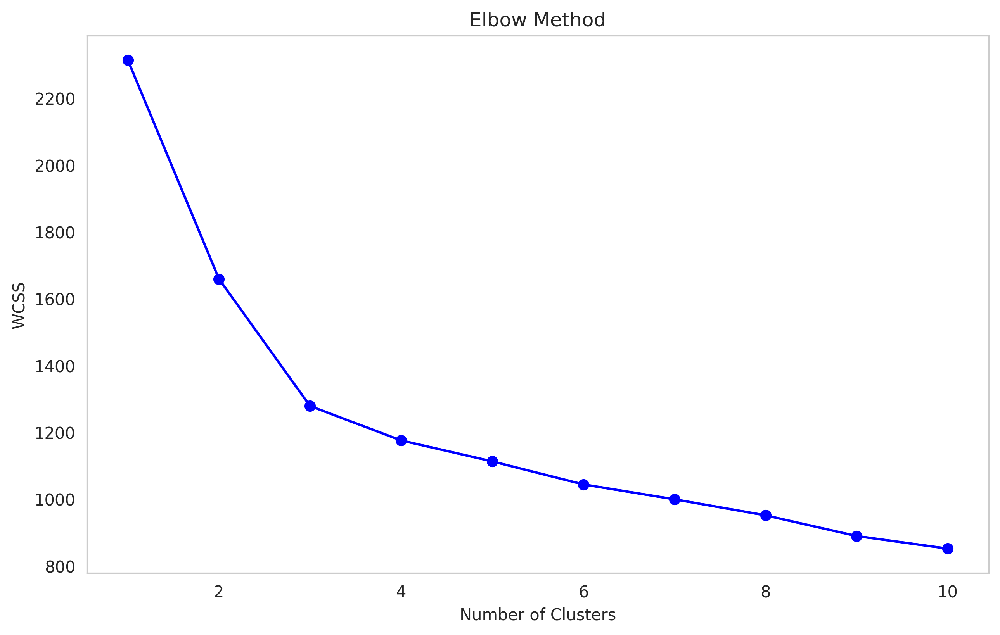

In [116]:
sns.set_style("whitegrid")

# Determine the optimal number of clusters using the Elbow Method
wcss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, init='k-means++', max_iter=300, n_init=10, random_state=0)
    kmeans.fit(scaled_features)
    wcss.append(kmeans.inertia_)

plt.figure(figsize=(10, 6), dpi=300)
plt.plot(range(1, 11), wcss, marker='o', linestyle='-', color='blue')
plt.title('Elbow Method')
plt.xlabel('Number of Clusters')
plt.ylabel('WCSS')
# plt.grid(True)
plt.grid(False)  # Removes grid lines
plt.show()

The adjusted Elbow Method graph, with reduced computational parameters, successfully provides a visualization of the within-cluster sum of squares (WCSS) against the number of clusters. From this graph, we can observe that the WCSS decreases as the number of clusters increases, with a noticeable bend around 3 clusters. This "elbow" suggests that 3 might be the optimal number of clusters for this dataset, aligning with our expectation given the wine dataset's inherent grouping into three types of cultivars.

### Step 4: K-Means Clustering

With the optimal number of clusters determined as 3, we will now apply the K-Means clustering algorithm to segment the wines into clusters based on their scaled features.

In [117]:
# Step 4: Perform K-Means Clustering with the determined optimal number of clusters (3)
kmeans_final = KMeans(n_clusters=3, init='k-means++', max_iter=300, n_init=10, random_state=0)
cluster_labels = kmeans_final.fit_predict(scaled_features)

# Add the cluster labels to the dataframe
df['cluster'] = cluster_labels

# Display the first few rows of the dataframe to check the cluster assignment
df.head()

,alcohol,malic_acid,ash,alcalinity_of_ash,magnesium,total_phenols,flavanoids,nonflavanoid_phenols,proanthocyanins,color_intensity,hue,od280/od315_of_diluted_wines,proline,cluster
0,1.518613,-0.562250,0.232053,-1.169593,1.913905,0.808997,1.034819,-0.659563,1.224884,0.251717,0.362177,1.847920,1.013009,2
1,0.246290,-0.499413,-0.827996,-2.490847,0.018145,0.568648,0.733629,-0.820719,-0.544721,-0.293321,0.406051,1.113449,0.965242,2
2,0.196879,0.021231,1.109334,-0.268738,0.088358,0.808997,1.215533,-0.498407,2.135968,0.269020,0.318304,0.788587,1.395148,2
3,1.691550,-0.346811,0.487926,-0.809251,0.930918,2.491446,1.466525,-0.981875,1.032155,1.186068,-0.427544,1.184071,2.334574,2
4,0.295700,0.227694,1.840403,0.451946,1.281985,0.808997,0.663351,0.226796,0.401404,-0.319276,0.362177,0.449601,-0.037874,2


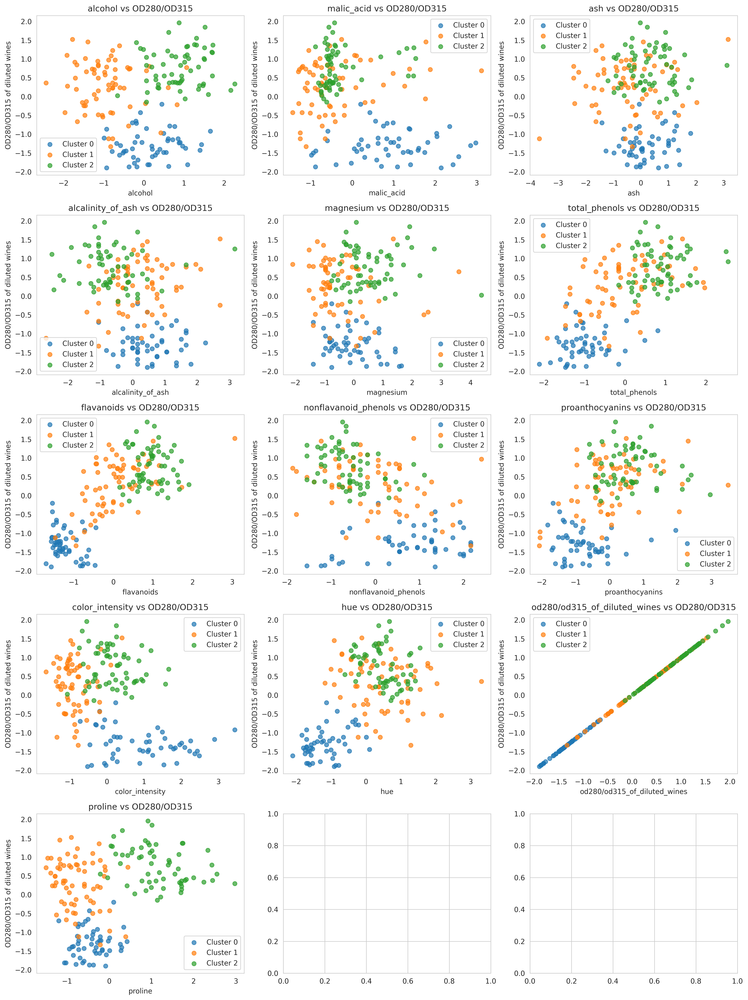

In [118]:
# List of all features to plot
features_to_plot = [
    'alcohol', 'malic_acid', 'ash', 'alcalinity_of_ash', 'magnesium',
    'total_phenols', 'flavanoids', 'nonflavanoid_phenols',
    'proanthocyanins', 'color_intensity', 'hue',
    'od280/od315_of_diluted_wines', 'proline'
]

# Calculate the number of rows needed for subplots
num_features = len(features_to_plot)
num_rows = num_features // 3 + (num_features % 3 > 0)
num_cols = 3

# Create a figure and a grid of subplots
fig, axs = plt.subplots(num_rows, num_cols, figsize=(15, num_rows * 4), dpi=300)

# Flatten the array of axes for easy iteration
axs = axs.flatten()

# Iterate over the features and create scatter plots
for i, feature in enumerate(features_to_plot):
    ax = axs[i]
    for cluster in range(3):
        ax.scatter(
            df[df['cluster'] == cluster][feature],
            df[df['cluster'] == cluster]['od280/od315_of_diluted_wines'],
            label=f'Cluster {cluster}', alpha=0.7)
    ax.set_title(f'{feature} vs OD280/OD315')
    ax.set_xlabel(feature)
    ax.set_ylabel('OD280/OD315 of diluted wines')
    ax.legend()
    ax.grid(False)  # Disable the grid

# Adjust the layout and display the plot
plt.tight_layout()
plt.show()

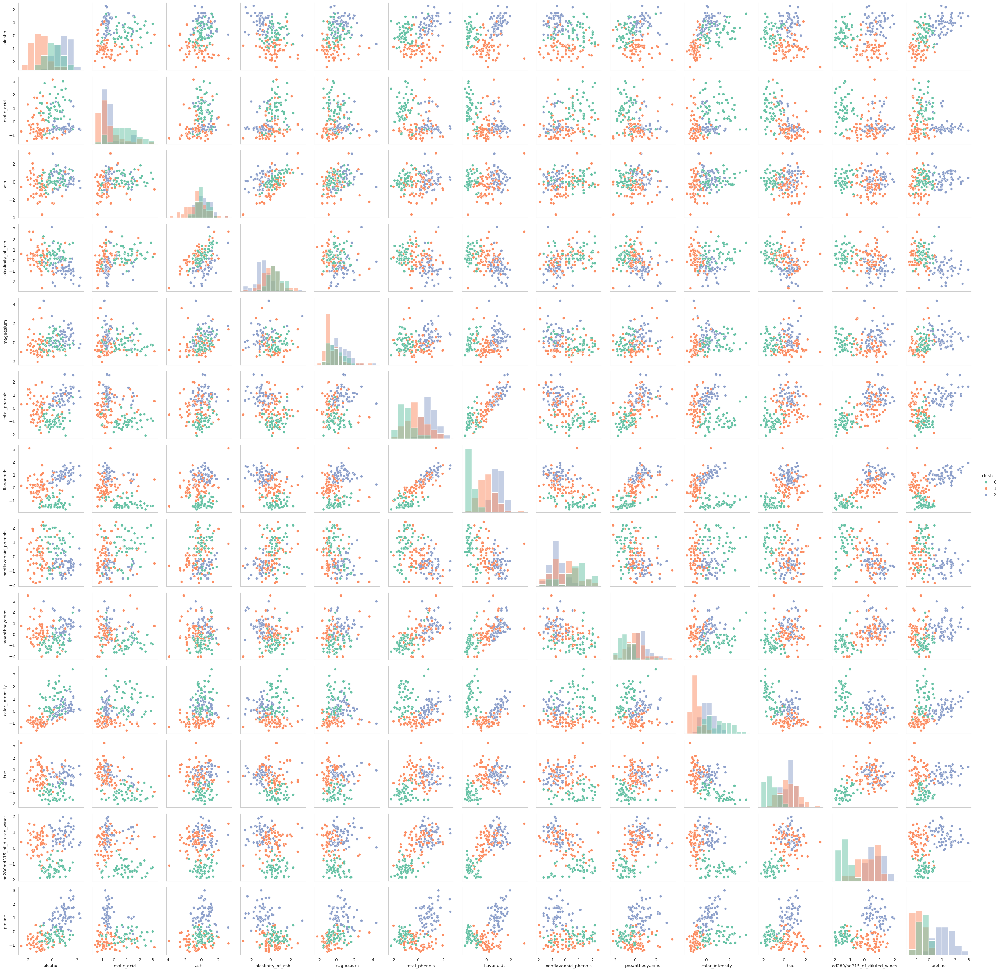

In [119]:
# Convert 'cluster' to a categorical type for coloring
df['cluster'] = df['cluster'].astype('category')

# List of features to plot
features = [
    'alcohol', 'malic_acid', 'ash', 'alcalinity_of_ash', 'magnesium',
    'total_phenols', 'flavanoids', 'nonflavanoid_phenols',
    'proanthocyanins', 'color_intensity', 'hue',
    'od280/od315_of_diluted_wines', 'proline'
]

# Initialize a PairGrid object
g = sns.PairGrid(df, vars=features, hue='cluster', palette='Set2')

# Map the plots to the grid
g = g.map_diag(sns.histplot) # For diagonal plots
g = g.map_offdiag(sns.scatterplot) # For off-diagonal plots

# Remove grid lines from all subplots
for ax in g.axes.flatten():
    ax.grid(False) # Disable the grid

# Add a legend
g.add_legend()

# Show the plot
plt.show()

### Step 5: Evaluation

Evaluating the clustering result involves assessing the cohesion and separation of the clusters. One common method for this is the silhouette score.

Next, we will evaluate the clustering performance using the silhouette score. This metric measures how similar an object is to its own cluster compared to other clusters, with a higher score indicating better-defined clusters.

In [120]:
from sklearn.metrics import silhouette_score

# Calculate the silhouette score for the clustering
silhouette_avg = silhouette_score(scaled_features, cluster_labels)
print("The average silhouette_score is :", silhouette_avg)

The average silhouette_score is : 0.2859419965707488


The silhouette score for our clustering is approximately 0.286. This score ranges from -1 to 1, where a high value indicates that the object is well matched to its own cluster and poorly matched to neighboring clusters. A score of 0.286 suggests that the clusters are reasonably well defined but not highly distinct from each other. There's some overlap or closeness between clusters, which is expected in real-world data where clear, distinct groupings are rare.

### Step 6: Interpretation and Insights

The final step is to analyze the clusters to understand their characteristics and derive insights about the dataset.

Finally, we'll analyze the characteristics of each cluster to understand the underlying patterns and derive insights about the dataset. This involves looking at the mean values of features within each cluster to identify distinguishing characteristics.

In [121]:
# Analyze the clusters by calculating mean values of features for each cluster
cluster_means = df.groupby('cluster').mean()
cluster_means.head()

,alcohol,malic_acid,ash,alcalinity_of_ash,magnesium,total_phenols,flavanoids,nonflavanoid_phenols,proanthocyanins,color_intensity,hue,od280/od315_of_diluted_wines,proline
cluster,,,,,,,,,,,,,
0,0.164907,0.871547,0.186898,0.524367,-0.075473,-0.979330,-1.215248,0.726064,-0.779706,0.941539,-1.164789,-1.292412,-0.407088
1,-0.939003,-0.391966,-0.439201,0.208988,-0.463774,-0.053348,0.066904,-0.019822,0.064792,-0.882075,0.452982,0.289738,-0.756026
2,0.878097,-0.304576,0.318942,-0.664524,0.564888,0.876505,0.943639,-0.585590,0.581783,0.167188,0.483728,0.767053,1.158347


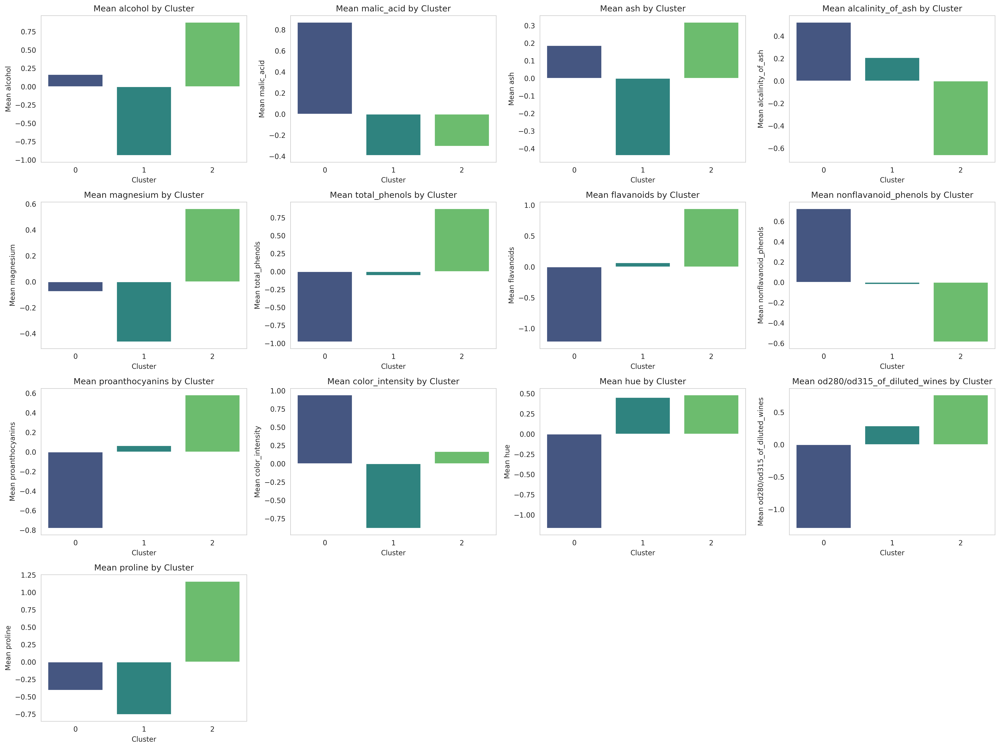

In [122]:
# Assuming 'cluster_means' is your DataFrame containing mean values of features for each cluster
features = [
    'alcohol', 'malic_acid', 'ash', 'alcalinity_of_ash', 'magnesium',
    'total_phenols', 'flavanoids', 'nonflavanoid_phenols',
    'proanthocyanins', 'color_intensity', 'hue',
    'od280/od315_of_diluted_wines', 'proline'
]

# Set the figure size for the subplot grid
plt.figure(figsize=(20, 15), dpi=300)

# Iterate over each feature to create a subplot for its mean values across clusters
for i, feature in enumerate(features, 1):
    plt.subplot(4, 4, i)  # Adjust the grid size based on the number of features
    sns.barplot(x='cluster', y=feature, data=cluster_means, palette='viridis')
    plt.title(f'Mean {feature} by Cluster')
    plt.xlabel('Cluster')
    plt.ylabel(f'Mean {feature}')
    plt.grid(False)  # Removes grid lines

plt.tight_layout()
plt.show()

The analysis of the Wine Dataset using K-Means clustering has successfully identified three distinct clusters based on the chemical composition of the wines. Here are the observations, insights, and conclusions drawn from the cluster analysis:

Observations of the 3 Clusters:

1. **`Cluster 0`** is characterized by higher malic acid and color intensity, suggesting these wines might be more robust and flavorful. However, they have lower levels of total phenols and flavanoids, which could indicate a lower antioxidant capacity and possibly a different taste profile or aging potential compared to the other clusters.
2. **`Cluster 1`** represents wines with moderate alcohol content, malic acid, and the lowest color intensity among the clusters. This cluster has higher levels of total phenols and flavanoids compared to Cluster 0 but lower than Cluster 2, suggesting these wines might offer a balance between flavor and health-related attributes associated with phenolic content.
3. **`Cluster 2`** includes wines with the highest alcohol, magnesium, flavanoids, total phenols, and significantly higher proline levels, marking them as potentially of higher quality. The high od280/od315 of diluted wines ratio indicates better aging potential and phenolic content, important factors in wine quality.

## Takeaways and Conclusions

### Key Insights
---

- The clustering suggests a strong correlation between the chemical properties of wines and their potential quality and characteristics. For instance, high levels of flavanoids and proline are traditionally associated with higher quality wines.

- The differences in chemical composition across the clusters could reflect varietal characteristics, indicating that certain grape varieties may naturally possess chemical profiles that predispose them to higher quality.

- The analysis also highlights the potential of using machine learning techniques like K-Means clustering to categorize wines based on their chemical properties, which could be valuable for sommeliers, wine makers, and consumers in identifying wine characteristics and quality without relying solely on brand or region.

### Conclusions:
---

The K-Means clustering of the Wine Dataset provides a meaningful segmentation of the wines based on their inherent chemical properties, demonstrating the utility of unsupervised learning in uncovering natural groupings within complex data. This approach can offer valuable insights into the relationship between chemical composition and wine quality, potentially guiding the wine industry in production, classification, and marketing strategies.

This case study underscores the potential for applying machine learning techniques to enhance understanding and decision-making in diverse fields, including food and beverage, where such analyses can enrich the appreciation and selection of products based on underlying qualities not immediately apparent through traditional means.